# 1. Supervised Learning - Classification

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.autograd import Variable

import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import confusion_matrix

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
train_set = torchvision.datasets.FashionMNIST(
    "./data", download=True, transform=transforms.Compose([transforms.ToTensor()])
)
test_set = torchvision.datasets.FashionMNIST(
    "./data", download=True, train=False, transform=transforms.Compose([transforms.ToTensor()])
)

100%|██████████| 26421880/26421880 [00:01<00:00, 20934771.87it/s]


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 340406.31it/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 6255070.07it/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 8385350.29it/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



In [ ]:
train_loader = torch.utils.data.DataLoader(train_set, batch_size=100)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=100)


def output_label(label):
    output_mapping = {
        0: "T-shirt/Top",
        1: "Trouser",
        2: "Pullover",
        3: "Dress",
        4: "Coat",
        5: "Sandal",
        6: "Shirt",
        7: "Sneaker",
        8: "Bag",
        9: "Ankle Boot",
    }
    input = label.item() if type(label) == torch.Tensor else label
    return output_mapping[input]

9


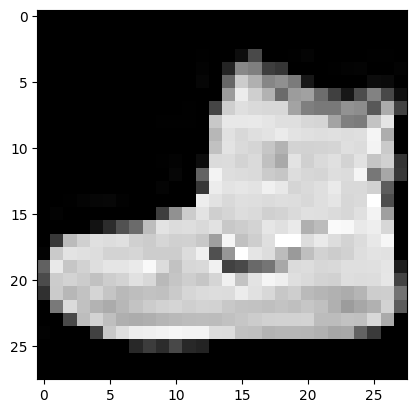

In [ ]:
image, label = next(iter(train_set))
plt.imshow(image.squeeze(), cmap="gray")
print(label)

In [ ]:
class FashionMNISTClassifier(nn.Module):
    def __init__(self):
        super(FashionMNISTClassifier, self).__init__()
        # Define the layers
        self.fc1 = nn.Linear(28 * 28, 256)  # Input: 784, Output: 256 neurons
        self.fc2 = nn.Linear(256, 128)  # Input: 256, Output: 128 neurons
        self.fc3 = nn.Linear(128, 10)  # Output layer: 10 classes

    def forward(self, x):
        # Flatten the input from (batch_size, 1, 28, 28) to (batch_size, 784)
        x = x.view(x.size(0), -1)
        # Forward pass through the network
        x = nn.functional.relu(self.fc1(x))
        x = nn.functional.relu(self.fc2(x))
        x = nn.functional.log_softmax(self.fc3(x), dim=1)  # log_softmax for classification
        return x


model = FashionMNISTClassifier()

error = nn.CrossEntropyLoss()

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
print(model)

FashionMNISTClassifier(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=10, bias=True)
)


In [ ]:
# Training the model
epochs = 15  # Number of epochs to train
model.train()  # Set the model to training mode
count = 0

loss_list = []
iteration_list = []
accuracy_list = []

for epoch in range(epochs):
    running_loss = 0
    correct = 0
    total = 0

    for images, labels in train_loader:
        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        output = model(images)

        # Compute loss
        loss = criterion(output, labels)

        # Backward pass
        loss.backward()

        # Update weights
        optimizer.step()

        count += 1

        running_loss += loss.item()

        _, predicted = torch.max(output, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    loss_list.append(running_loss / len(train_loader))
    iteration_list.append(count)
    accuracy_list.append(accuracy)
    print(f"Epoch {epoch+1}/{epochs} - Loss: {running_loss/len(train_loader):.4f}, Accuracy: {accuracy:.2f}%")

Epoch 1/15 - Loss: 0.5465, Accuracy: 80.80%
Epoch 2/15 - Loss: 0.3819, Accuracy: 86.11%
Epoch 3/15 - Loss: 0.3393, Accuracy: 87.48%
Epoch 4/15 - Loss: 0.3127, Accuracy: 88.45%
Epoch 5/15 - Loss: 0.2920, Accuracy: 89.25%
Epoch 6/15 - Loss: 0.2762, Accuracy: 89.86%
Epoch 7/15 - Loss: 0.2612, Accuracy: 90.28%
Epoch 8/15 - Loss: 0.2476, Accuracy: 90.78%
Epoch 9/15 - Loss: 0.2368, Accuracy: 91.14%
Epoch 10/15 - Loss: 0.2252, Accuracy: 91.60%
Epoch 11/15 - Loss: 0.2167, Accuracy: 91.84%
Epoch 12/15 - Loss: 0.2083, Accuracy: 92.19%
Epoch 13/15 - Loss: 0.2011, Accuracy: 92.40%
Epoch 14/15 - Loss: 0.1920, Accuracy: 92.78%
Epoch 15/15 - Loss: 0.1839, Accuracy: 93.03%


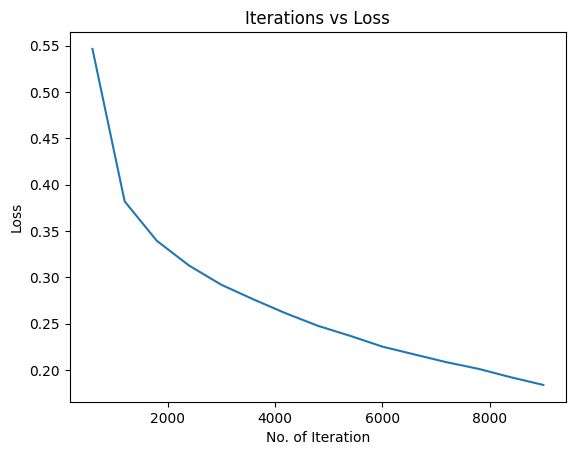

In [ ]:
plt.plot(iteration_list, loss_list)
plt.xlabel("No. of Iteration")
plt.ylabel("Loss")
plt.title("Iterations vs Loss")
plt.show()

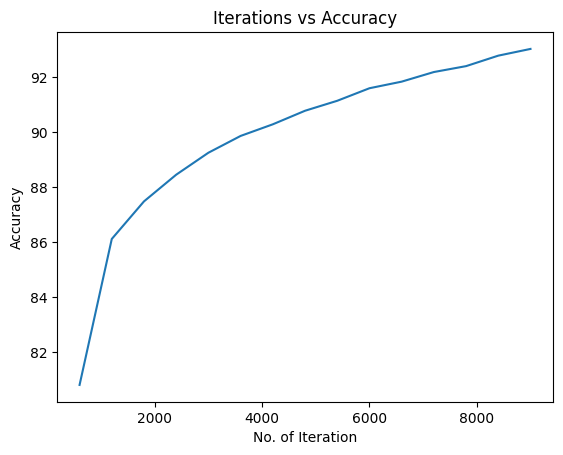

In [ ]:
plt.plot(iteration_list, accuracy_list)
plt.xlabel("No. of Iteration")
plt.ylabel("Accuracy")
plt.title("Iterations vs Accuracy")
plt.show()

In [ ]:
class_correct = [0.0 for _ in range(10)]
total_correct = [0.0 for _ in range(10)]

with torch.no_grad():
    for images, labels in test_loader:
        test = Variable(images)
        outputs = model(test)
        predicted = torch.max(outputs, 1)[1]
        c = (predicted == labels).squeeze()

        for i in range(100):
            label = labels[i]
            class_correct[label] += c[i].item()
            total_correct[label] += 1

for i in range(10):
    print("Accuracy of {}: {:.2f}%".format(output_label(i), class_correct[i] * 100 / total_correct[i]))

Accuracy of T-shirt/Top: 91.40%
Accuracy of Trouser: 97.60%
Accuracy of Pullover: 79.20%
Accuracy of Dress: 84.50%
Accuracy of Coat: 87.10%
Accuracy of Sandal: 94.00%
Accuracy of Shirt: 58.50%
Accuracy of Sneaker: 95.00%
Accuracy of Bag: 98.60%
Accuracy of Ankle Boot: 97.50%


In [ ]:
# Evaluate the model on the test set
model.eval()  # Set the model to evaluation mode
correct = 0
total = 0

predicted_list = []
label_list = []

with torch.no_grad():  # Disable gradient computation
    for images, labels in test_loader:
        label_list.extend(labels.cpu().numpy())
        output = model(images)
        _, predicted = torch.max(output, 1)
        predicted_list.extend(predicted.cpu().numpy())
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
predicted_list = np.array(predicted_list)
label_list = np.array(label_list)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Accuracy: 88.34%


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

labels_name = [output_label(i) for i in range(10)]


def show_confusion_matrix(validations, predictions, num_classes):
    matrix = confusion_matrix(validations, predictions)
    plt.figure(figsize=(num_classes, num_classes))
    hm = sns.heatmap(
        matrix,
        cmap="coolwarm",
        linecolor="white",
        linewidths=1,
        xticklabels=labels_name,
        yticklabels=labels_name,
        annot=True,
        fmt="d",
    )
    plt.yticks(rotation=0)  # Don't rotate (vertically) the y-axis labels
    # hm.set_ylim(0, len(matrix))
    plt.title("Confusion Matrix")
    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.show()

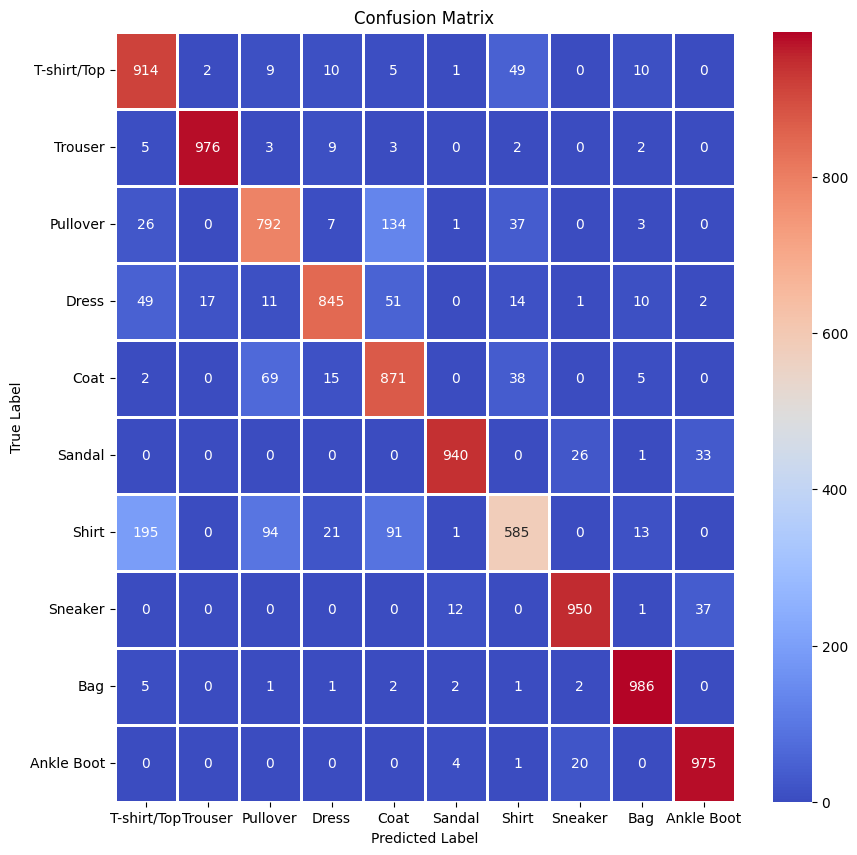

In [ ]:
show_confusion_matrix(label_list, predicted_list, 10)

# 2. Unsupervised Learning - Dimensionality reduction

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torch.nn.functional as F

In [ ]:
train_loader_autoen = DataLoader(dataset=train_set, batch_size=32, shuffle=True)
test_loader_autoen = DataLoader(dataset=test_set, batch_size=32, shuffle=True)

In [ ]:
class AutoEncoder(nn.Module):
    def __init__(self, img_size, lr_size):
        super(AutoEncoder, self).__init__()
        # Encoder
        self.e1 = nn.Linear(img_size * img_size, 500)
        self.e2 = nn.Linear(500, 250)
        # Latent Representation
        self.lr = nn.Linear(250, lr_size)
        # Decoder
        self.d1 = nn.Linear(lr_size, 250)
        self.d2 = nn.Linear(250, 500)
        # Output
        self.o1 = nn.Linear(500, img_size * img_size)

    def forward(self, x):
        # Encoder
        x = F.relu(self.e1(x))
        x = F.relu(self.e2(x))
        # Latent Representation
        x = torch.sigmoid(self.lr(x))
        x = F.relu(self.d1(x))
        x = F.relu(self.d2(x))
        x = self.o1(x)
        return x

In [ ]:
model = AutoEncoder(28, 10)

loss_function = torch.nn.MSELoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-1, weight_decay=1e-8)

In [ ]:
epochs = 3
outputs = []
losses = []

for epoch in range(epochs):
    running_loss = 0
    for image, _ in train_loader_autoen:

        image = image.reshape(-1, 28 * 28)

        # Output of Autoencoder
        reconstructed = model(image)

        # Calculating the loss function
        loss = loss_function(reconstructed, image)

        # The gradients are set to zero,
        # the gradient is computed and stored.
        # .step() performs parameter update
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        losses.append(loss)

        # Storing the losses in a list for plotting
    outputs.append((epochs, image, reconstructed))
    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader_autoen):.4f}")

Epoch 1/3, Loss: 0.5968
Epoch 2/3, Loss: 0.1276
Epoch 3/3, Loss: 0.0881


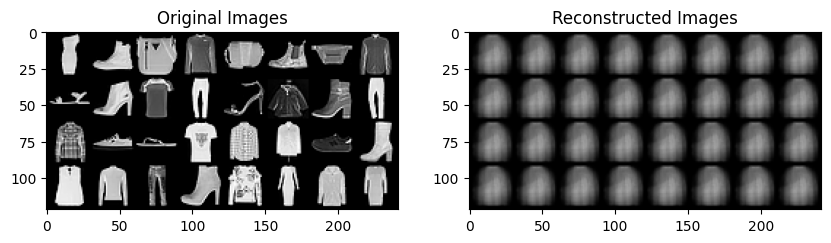

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

im = [i.reshape(-1, 28, 28) for i in outputs[0][1]]
axes[0].imshow(torchvision.utils.make_grid(im, nrow=8).permute(1, 2, 0))
axes[0].set_title("Original Images")

# Reconstructed images
rec = [i.reshape(-1, 28, 28) for i in outputs[0][2]]
axes[1].imshow(torchvision.utils.make_grid(rec, nrow=8).permute(1, 2, 0))
axes[1].set_title("Reconstructed Images")
plt.show()

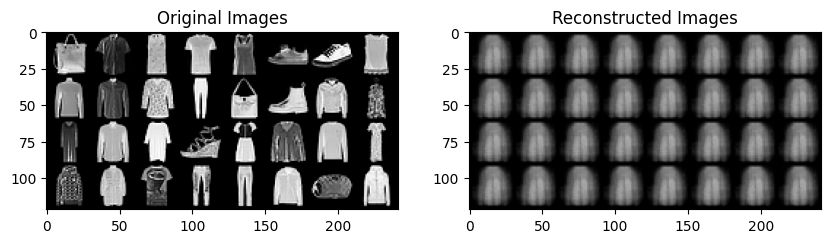

In [ ]:
model.eval()  # Set the model to evaluation mode

with torch.no_grad():  # Disable gradient calculation for inference
    for images, _ in test_loader_autoen:
        # Reconstruct images from the test set
        images = images.reshape(-1, 28 * 28)
        reconstructed = model(images)
        break  # Just visualize the first batch

# Display original and reconstructed images
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Original images
im = [i.reshape(-1, 28, 28) for i in images]
axes[0].imshow(torchvision.utils.make_grid(im, nrow=8).permute(1, 2, 0))
axes[0].set_title("Original Images")

# Reconstructed images
rec = [i.reshape(-1, 28, 28) for i in reconstructed]
axes[1].imshow(torchvision.utils.make_grid(rec, nrow=8).permute(1, 2, 0))
axes[1].set_title("Reconstructed Images")

plt.show()

# 3. Usage of pre-trained models - Speech Recognition

In [ ]:
import torch
import torchaudio
from torchaudio.transforms import MelSpectrogram, Resample

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.4.1+cu121
2.4.1+cu121
cpu


In [ ]:
import IPython
import matplotlib.pyplot as plt
from torchaudio.utils import download_asset

SPEECH_FILE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")

100%|██████████| 106k/106k [00:00<00:00, 6.28MB/s]


In [ ]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [ ]:
model = bundle.get_model().to(device)

print(model.__class__)

Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_base_ls960_asr_ls960.pth" to /root/.cache/torch/hub/checkpoints/wav2vec2_fairseq_base_ls960_asr_ls960.pth
100%|██████████| 360M/360M [00:01<00:00, 201MB/s]


<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [ ]:
IPython.display.Audio(SPEECH_FILE)

In [ ]:
waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

In [ ]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

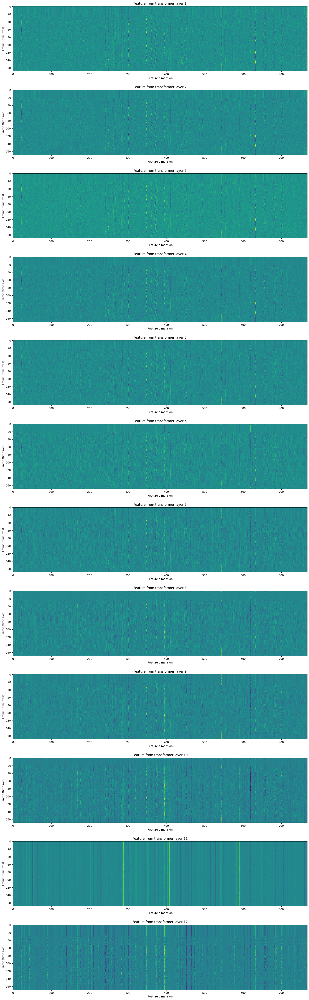

In [ ]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

In [ ]:
with torch.inference_mode():
    emission, _ = model(waveform)

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


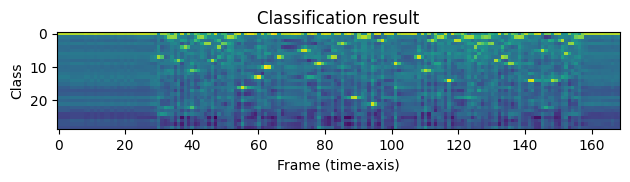

In [ ]:
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

In [ ]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [ ]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [ ]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

I|HAD|THAT|CURIOSITY|BESIDE|ME|AT|THIS|MOMENT|


In [ ]:
waveform, sample_rate = torchaudio.load("audioyt.wav")
# https://www.youtube.com/shorts/rNNVMghNeGI
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

with torch.inference_mode():
    emission, _ = model(waveform)

decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])
print(transcript)
IPython.display.Audio("audioyt.wav")

WHY|DID|THE|COMPUTER|BREAK|UP|WITH|THE|INTERNETE|IT|FOUND|THE|CONNECTION|UNSTABLE|I|NEED|SOME|SPACE|IT|SAID|


In [ ]:
waveform, sample_rate = torchaudio.load("audio_yt_2.wav")
# https://www.youtube.com/shorts/G8mA-uJKigI
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

with torch.inference_mode():
    emission, _ = model(waveform)

decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])
print(transcript)
IPython.display.Audio("audio_yt_2.wav")

A|MAN|RECEIVES|A|PHONE|CALL|FROM|HIS|DOCTOR|THE|DOCTOR|SAYS|I|HAVE|SOME|GOOD|NEWS|AND|SOME|BAD|NEWS|THE|MAN|SAYS|OQU|GIVE|ME|THE|GOOD|NEWS|FIRST|THE|DOCTOR|SAYS|THE|GOOD|NEWS|IS|YOU|HAVE|TWENTY|FOUR|HOURS|TO|LIVE|THE|MAN|REPLIES|OH|NO|IF|THAT'S|THE|GOOD|NEWS|AND|WHAT'S|THE|BAD|NEWS|THE|DOCTOR|SAYS|THE|BAD|NEWS|IS|I|FORGOT|TO|CALL|YOU|YESTERDAY|


# 4. DIY Implementation - Artificial Neuron Model